In [ ]:
!wget https://hf.co/danjacobellis/walloc/resolve/main/Stereo_Li_96c_J8_nf8_v1.0.2.pth

In [1]:
import io
import os
import torch
import torchaudio
import matplotlib.pyplot as plt
from PIL import Image
from einops import rearrange
from IPython.display import Audio
from walloc import walloc
class Config: pass

In [2]:
device = "cpu"
checkpoint = torch.load("Stereo_Li_96c_J8_nf8_v1.0.2.pth",map_location="cpu",weights_only=False)
codec_config = checkpoint['config']
codec = walloc.Codec1D(
    channels = codec_config.channels,
    J = codec_config.J,
    Ne = codec_config.Ne,
    Nd = codec_config.Nd,
    latent_dim = codec_config.latent_dim,
    latent_bits = codec_config.latent_bits,
    lightweight_encode = codec_config.lightweight_encode,
    post_filter = codec_config.post_filter
)
codec.load_state_dict(checkpoint['model_state_dict'])
codec = codec.to(device)
codec.eval();

/home/dgj335/.local/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


In [3]:
L = 2**20 - 2**(codec.J+1)
x, fs = torchaudio.load("stereo_codec_test_signal.wav")
x = torchaudio.transforms.Resample(fs, 44100)(x)[:,:L]

In [4]:
Audio(x.numpy(),rate=44100)

In [5]:
with torch.no_grad():
    y, _, _ = codec(x.unsqueeze(0))
    y = y[0]

In [6]:
Audio(y,rate=44100)

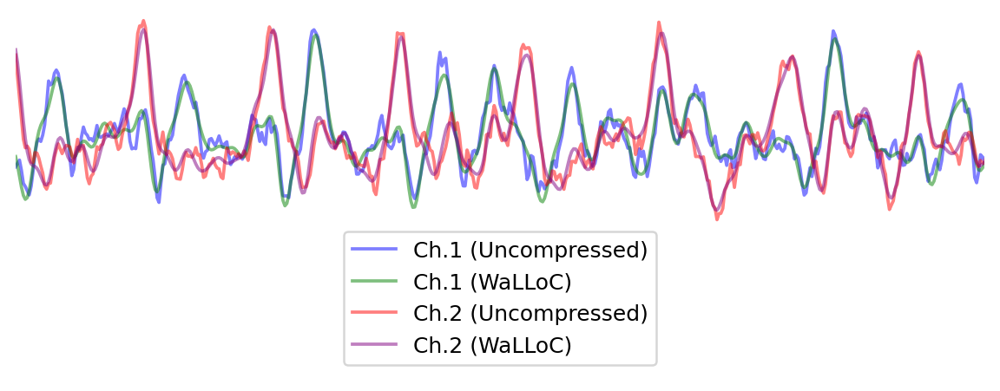

In [7]:
start, end = 564000, 566000
plt.figure(figsize=(8, 3), dpi=180)
plt.plot(x[0, start:end], alpha=0.5, c='b', label='Ch.1 (Uncompressed)')
plt.plot(y[0, start:end], alpha=0.5, c='g', label='Ch.1 (WaLLoC)')
plt.plot(x[1, start:end], alpha=0.5, c='r', label='Ch.2 (Uncompressed)')
plt.plot(y[1, start:end], alpha=0.5, c='purple', label='Ch.2 (WaLLoC)')

plt.xlim([0,500])
plt.ylim([-0.6,0.3])
plt.legend(loc='lower center')
plt.box(False)
plt.xticks([])
plt.yticks([])
plt.savefig("test.svg")

In [8]:
with torch.no_grad():
    X = codec.wavelet_analysis(x.unsqueeze(0), J=codec.J)
    Y = codec.encoder(X)

Text(0.5, 1.0, 'Histogram of latents')

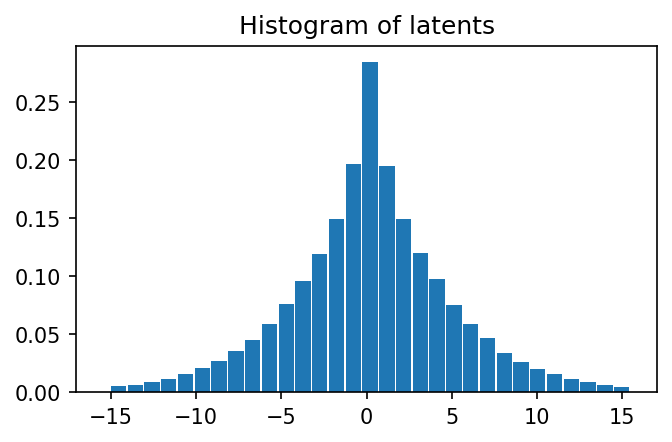

In [9]:
plt.figure(figsize=(5,3),dpi=150)
plt.hist(
    Y.flatten().numpy(),
    range=(-15.5,15.5),
    bins=63,
    density=True,
    width=0.9);
plt.title("Histogram of latents")

In [10]:
def scale_for_display(img, n_bits):
    scale_factor = (2**8 - 1) / (2**n_bits - 1)
    lut = [int(i * scale_factor) for i in range(2**n_bits)]
    channels = img.split()
    scaled_channels = [ch.point(lut * 2**(8-n_bits)) for ch in channels]
    return Image.merge(img.mode, scaled_channels)

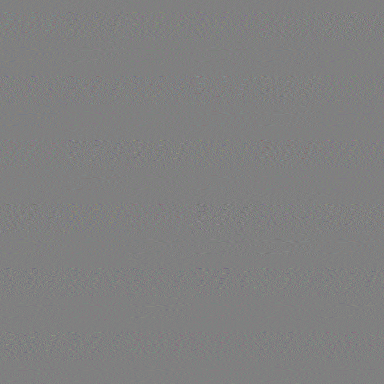

compression_ratio:  10.087431904367746


In [11]:
ℓ = int(Y.shape[-1] ** 0.5)
Y2d = Y.view(Y.shape[0], Y.shape[1], ℓ, ℓ)
Y_padded = torch.nn.functional.pad(Y2d, (0, 0, 0, 0, 0, 12))
Y_pil = walloc.latent_to_pil(Y_padded,codec.latent_bits,3)
display(scale_for_display(Y_pil[0], codec.latent_bits))
Y_pil[0].save('latent.webp',lossless=True)
webp = [Image.open("latent.webp")]
Y_rec = walloc.pil_to_latent(webp,108,codec.latent_bits,3)
assert(Y_rec.equal(Y_padded))
print("compression_ratio: ", x.numel()/os.path.getsize("latent.webp"))